In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_000.png
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_004_009_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_001_003.png
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_000_001_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_005.png
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_003_002_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_003_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_002_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_001_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_002_003.png
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_005_006_meta.json
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_000_001.png
/kaggle/input/datasets/wessammahmoud/dotav2/P1869/P1869_tile_000_000_meta.json
/ka

# Aerial Panorama Stitching Pipeline
## Overview
This notebook builds a full panorama stitching pipeline for DOTA aerial images.

**Pipeline:**
1. Load Tiles & Metadata
2. CLAHE Preprocessing
3. LoFTR Feature Matching
4. RANSAC Homography
5. Multi-band Blending (Laplacian Pyramid)
6. Visualization

In [5]:
!pip install kornia opencv-python-headless -q

import os
import json
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

print(f"OpenCV : {cv2.__version__}")
print(f"PyTorch: {torch.__version__}")
print(f"Device : {'GPU ✓' if torch.cuda.is_available() else 'CPU'}")

OUTPUT_DIR = "/kaggle/working"
os.makedirs(OUTPUT_DIR, exist_ok=True)
print("Ready ✓")

OpenCV : 4.13.0
PyTorch: 2.10.0+cu128
Device : GPU ✓
Ready ✓


## Step 1 — Load Tiles & Metadata
Load all tiles and their metadata from the dataset,
sorted by (row, col) to know each tile's position in the original image.

In [6]:
DATASET_DIR = "/kaggle/input/datasets/wessammahmoud/dotav2"
SELECTED    = ["P2759", "P1869", "P1382", "P1387"]

def load_tiles(img_name):
    folder     = os.path.join(DATASET_DIR, img_name)
    json_files = sorted(glob.glob(os.path.join(folder, "*_meta.json")))
    tiles = []
    for jf in json_files:
        with open(jf, "r") as f:
            meta = json.load(f)
        img_path = jf.replace("_meta.json", ".png")
        img      = cv2.imread(img_path)
        if img is None:
            continue
        tiles.append({
            "img"  : img,
            "meta" : meta,
            "row"  : meta["pixel"]["row"],
            "col"  : meta["pixel"]["col"],
            "x1"   : meta["pixel"]["x1"],
            "y1"   : meta["pixel"]["y1"],
            "x2"   : meta["pixel"]["x2"],
            "y2"   : meta["pixel"]["y2"],
            "name" : meta["tile_name"],
            "gsd"  : meta["gsd_m_per_px"]
        })
    tiles.sort(key=lambda t: (t["row"], t["col"]))
    return tiles

all_tiles = {}
for name in SELECTED:
    tiles = load_tiles(name)
    all_tiles[name] = tiles
    rows = max(t["row"] for t in tiles) + 1
    cols = max(t["col"] for t in tiles) + 1
    h, w = tiles[0]["img"].shape[:2]
    print(f"{name}: {len(tiles)} tiles | {cols}x{rows} grid | "
          f"tile size: {w}x{h} | GSD: {tiles[0]['gsd']:.4f} m/px")

print(f"\nTotal: {sum(len(v) for v in all_tiles.values())} tiles loaded ✓")

P2759: 66 tiles | 11x6 grid | tile size: 1024x1024 | GSD: 0.2804 m/px
P1869: 60 tiles | 10x6 grid | tile size: 1024x1024 | GSD: 0.5640 m/px
P1382: 60 tiles | 6x10 grid | tile size: 1024x1024 | GSD: 0.1405 m/px
P1387: 40 tiles | 8x5 grid | tile size: 1024x1024 | GSD: 0.2582 m/px

Total: 226 tiles loaded ✓


## Step 2 — CLAHE Preprocessing
Contrast Limited Adaptive Histogram Equalization (CLAHE) enhances
local contrast in aerial images, making features more distinct
for the LoFTR matcher in the next step.
Applied on the L channel in LAB color space to avoid color distortion.

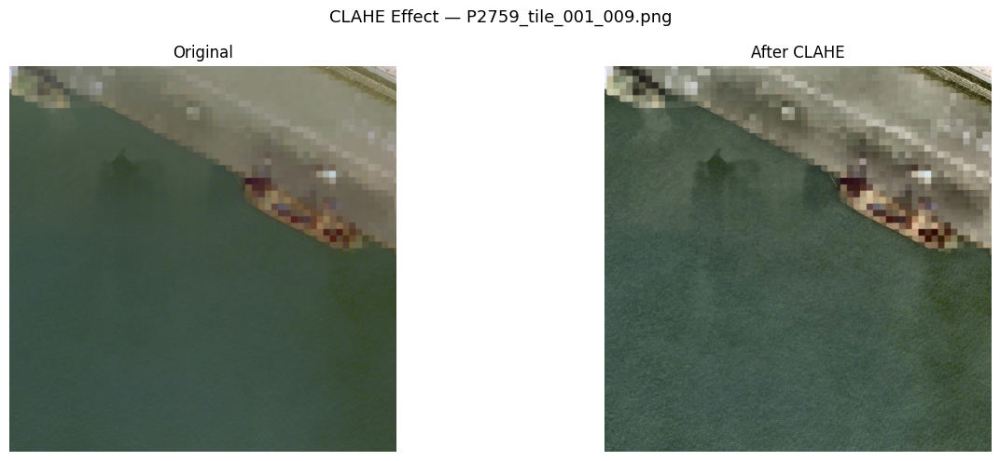

CLAHE applied on all 226 tiles ✓


In [7]:
def apply_clahe(img_bgr, clip_limit=3.0, tile_grid=(8, 8)):
    """
    Apply CLAHE on L channel in LAB color space.
    Returns enhanced BGR image.
    """
    lab   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid)
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Apply CLAHE on all tiles 
for name in SELECTED:
    for t in all_tiles[name]:
        t["img_enhanced"] = apply_clahe(t["img"])

# Visualize before/after on one sample tile
sample     = all_tiles["P2759"][20]
orig_rgb   = cv2.cvtColor(sample["img"],          cv2.COLOR_BGR2RGB)
enhanced   = cv2.cvtColor(sample["img_enhanced"], cv2.COLOR_BGR2RGB)

fig, axes  = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(orig_rgb);   axes[0].set_title("Original",      fontsize=12); axes[0].axis("off")
axes[1].imshow(enhanced);   axes[1].set_title("After CLAHE",   fontsize=12); axes[1].axis("off")

plt.suptitle(f"CLAHE Effect — {sample['name']}", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "clahe_comparison.png"), dpi=120)
plt.show()
print("CLAHE applied on all 226 tiles ✓")

## Step 2b — CLAHE Fine-tuning
Reducing clip_limit to avoid over-enhancement and noise amplification.
clip_limit=1.5 gives better results for high-resolution aerial imagery.

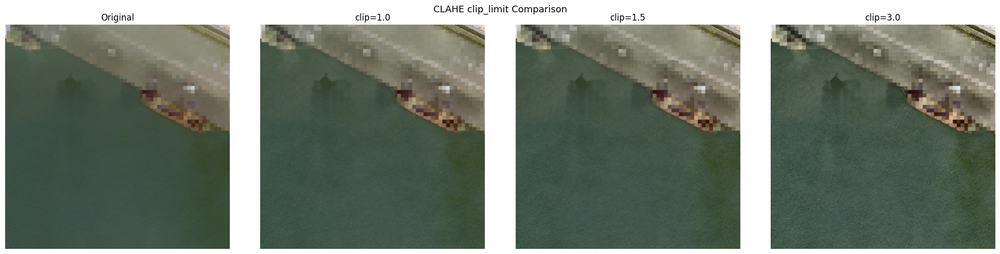

In [8]:
def apply_clahe(img_bgr, clip_limit=1.5, tile_grid=(8, 8)):
    lab   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid)
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Re-apply with lower clip_limit
for name in SELECTED:
    for t in all_tiles[name]:
        t["img_enhanced"] = apply_clahe(t["img"])

# Compare 3 different clip_limit values
sample   = all_tiles["P2759"][20]
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

clips = [None, 1.0, 1.5, 3.0]
titles = ["Original", "clip=1.0", "clip=1.5", "clip=3.0"]

for ax, clip, title in zip(axes, clips, titles):
    if clip is None:
        img = cv2.cvtColor(sample["img"], cv2.COLOR_BGR2RGB)
    else:
        img = cv2.cvtColor(apply_clahe(sample["img"], clip), cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.suptitle("CLAHE clip_limit Comparison", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "clahe_comparison.png"), dpi=120)
plt.show()

## Step 3 — LoFTR Feature Matching
LoFTR (Detector-Free Local Feature Matching) finds dense correspondences
between overlapping tiles using a transformer-based architecture.
Unlike ORB/SIFT, LoFTR works directly on image pairs without keypoint detection,
making it more robust for aerial imagery with repetitive patterns.
We only match adjacent tiles (right + down neighbors) using
the metadata coordinates to avoid unnecessary comparisons.

Device: cuda
Loading LoFTR model ...
Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_outdoor.ckpt" to /root/.cache/torch/hub/checkpoints/loftr_outdoor.ckpt


100%|██████████| 44.2M/44.2M [00:03<00:00, 13.0MB/s]


LoFTR ready ✓

Testing LoFTR on P2759 tile pair ...
Matches found : 783
Avg confidence: 0.880


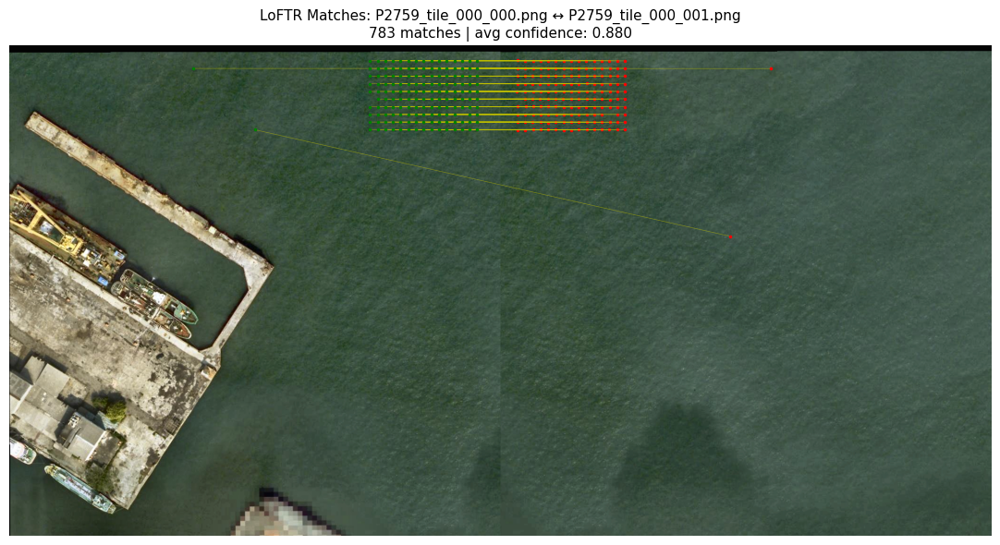

In [9]:
import kornia.feature as KF
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# Load LoFTR
print("Loading LoFTR model ...")
loftr = KF.LoFTR(pretrained="outdoor").to(device).eval()
print("LoFTR ready ✓")

def to_gray_tensor(img_bgr, max_size=512):
    gray  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, w  = gray.shape
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        gray  = cv2.resize(gray, (int(w*scale), int(h*scale)))
    tensor = torch.from_numpy(gray / 255.0).float()[None, None].to(device)
    return tensor, gray.shape

def match_loftr(img1_bgr, img2_bgr, conf_threshold=0.5):
    t1, shape1 = to_gray_tensor(img1_bgr)
    t2, shape2 = to_gray_tensor(img2_bgr)

    with torch.no_grad():
        correspondences = loftr({"image0": t1, "image1": t2})

    mkpts1 = correspondences["keypoints0"].cpu().numpy()
    mkpts2 = correspondences["keypoints1"].cpu().numpy()
    conf   = correspondences["confidence"].cpu().numpy()

    mask   = conf > conf_threshold
    mkpts1 = mkpts1[mask]
    mkpts2 = mkpts2[mask]
    conf   = conf[mask]

    # Scale back if resized
    h1, w1 = shape1
    oh, ow  = img1_bgr.shape[:2]
    if oh != h1:
        sx = ow / w1
        sy = oh / h1
        mkpts1 *= [sx, sy]
        mkpts2 *= [sx, sy]

    return mkpts1, mkpts2, conf

# Test on adjacent pair
print("\nTesting LoFTR on P2759 tile pair ...")
t1 = all_tiles["P2759"][0]
t2 = all_tiles["P2759"][1]

mkpts1, mkpts2, conf = match_loftr(
    t1["img_enhanced"],
    t2["img_enhanced"]
)
print(f"Matches found : {len(mkpts1)}")
print(f"Avg confidence: {conf.mean():.3f}")

# Visualize
img1_rgb = cv2.cvtColor(t1["img_enhanced"], cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(t2["img_enhanced"], cv2.COLOR_BGR2RGB)
combined = np.hstack([img1_rgb, img2_rgb])
offset   = img1_rgb.shape[1]

fig, ax  = plt.subplots(figsize=(18, 6))
ax.imshow(combined)

for (x1, y1), (x2, y2) in zip(mkpts1[:150], mkpts2[:150]):
    ax.plot([x1, x2 + offset], [y1, y2], "y-", linewidth=0.5, alpha=0.5)
    ax.plot(x1, y1, "g.", markersize=3)
    ax.plot(x2 + offset, y2, "r.", markersize=3)

ax.set_title(
    f"LoFTR Matches: {t1['name']} ↔ {t2['name']}\n"
    f"{len(mkpts1)} matches | avg confidence: {conf.mean():.3f}",
    fontsize=11
)
ax.axis("off")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "loftr_matches.png"), dpi=120)
plt.show()

## Step 4 — RANSAC Homography Estimation
RANSAC (Random Sample Consensus) filters outlier matches and computes
a robust homography matrix H that maps tile coordinates from one image
to another. Only inlier matches are used for the final transformation.
We use the metadata coordinates to determine which tiles are adjacent
(right neighbor / down neighbor) before running RANSAC.

In [10]:
def compute_homography(mkpts1, mkpts2, min_inliers=10):
    """
    Compute homography using RANSAC.
    Returns H matrix and number of inliers.
    """
    if len(mkpts1) < min_inliers:
        return None, 0

    H, mask = cv2.findHomography(
        mkpts1.reshape(-1, 1, 2),
        mkpts2.reshape(-1, 1, 2),
        cv2.RANSAC,
        ransacReprojThreshold=3.0,
        maxIters=2000,
        confidence=0.995
    )
    inliers = int(mask.sum()) if mask is not None else 0
    return H, inliers

# Compute homographies for all adjacent pairs
print("Computing homographies for all adjacent tile pairs ...\n")

all_homographies = {}   # img_name → {(row1,col1,row2,col2) → H}

for img_name in SELECTED:
    tiles      = all_tiles[img_name]
    tile_dict  = {(t["row"], t["col"]): t for t in tiles}
    max_row    = max(t["row"] for t in tiles)
    max_col    = max(t["col"] for t in tiles)

    homographies = {}
    total = valid = 0

    for t in tiles:
        r, c = t["row"], t["col"]

        # Right neighbor
        if (r, c+1) in tile_dict:
            n = tile_dict[(r, c+1)]
            mkpts1, mkpts2, conf = match_loftr(
                t["img_enhanced"], n["img_enhanced"]
            )
            H, inliers = compute_homography(mkpts1, mkpts2)
            homographies[( r, c, r, c+1)] = {"H": H, "inliers": inliers}
            total += 1
            if H is not None:
                valid += 1

        # Down neighbor
        if (r+1, c) in tile_dict:
            n = tile_dict[(r+1, c)]
            mkpts1, mkpts2, conf = match_loftr(
                t["img_enhanced"], n["img_enhanced"]
            )
            H, inliers = compute_homography(mkpts1, mkpts2)
            homographies[(r, c, r+1, c)] = {"H": H, "inliers": inliers}
            total += 1
            if H is not None:
                valid += 1

    all_homographies[img_name] = homographies
    print(f"{img_name}: {valid}/{total} valid homographies")

print(f"\nDone ✓")

Computing homographies for all adjacent tile pairs ...

P2759: 114/115 valid homographies
P1869: 104/104 valid homographies
P1382: 104/104 valid homographies
P1387: 67/67 valid homographies

Done ✓


## Step 5 — Multi-band Blending (Laplacian Pyramid)
Multi-band blending uses a Laplacian pyramid to seamlessly merge
overlapping tiles at multiple frequency bands.
This eliminates visible seams and ghosting artifacts that appear
with simple alpha blending, producing a smooth panorama.
The metadata pixel coordinates are used to place each tile
at its exact position, while LoFTR homographies refine the alignment.


P2759: canvas 8194x4609 px
  Placed 10/66 tiles ...
  Placed 20/66 tiles ...
  Placed 30/66 tiles ...
  Placed 40/66 tiles ...
  Placed 50/66 tiles ...
  Placed 60/66 tiles ...
  Done! ✓
  Saved → /kaggle/working/P2759_panorama.jpg

P1869: canvas 7477x4609 px
  Placed 10/60 tiles ...
  Placed 20/60 tiles ...
  Placed 30/60 tiles ...
  Placed 40/60 tiles ...
  Placed 50/60 tiles ...
  Placed 60/60 tiles ...
  Done! ✓
  Saved → /kaggle/working/P1869_panorama.jpg

P1382: canvas 4609x7477 px
  Placed 10/60 tiles ...
  Placed 20/60 tiles ...
  Placed 30/60 tiles ...
  Placed 40/60 tiles ...
  Placed 50/60 tiles ...
  Placed 60/60 tiles ...
  Done! ✓
  Saved → /kaggle/working/P1382_panorama.jpg

P1387: canvas 6043x3892 px
  Placed 10/40 tiles ...
  Placed 20/40 tiles ...
  Placed 30/40 tiles ...
  Placed 40/40 tiles ...
  Done! ✓
  Saved → /kaggle/working/P1387_panorama.jpg


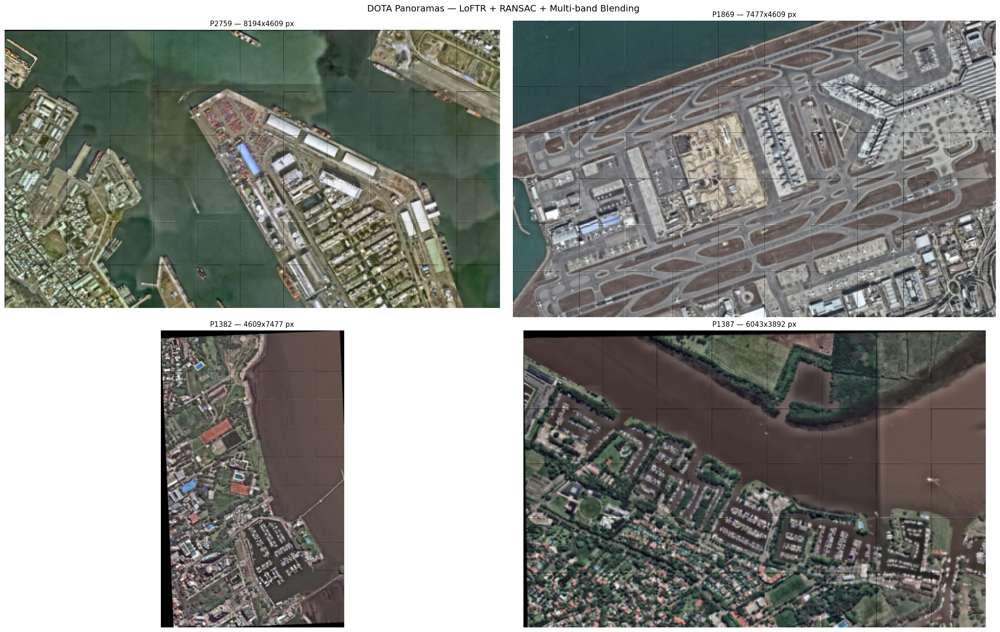


All panoramas saved ✓


In [11]:
def build_laplacian_pyramid(img, levels=4):
    """Build Laplacian pyramid for multi-band blending."""
    gp = [img.astype(np.float32)]
    for _ in range(levels):
        gp.append(cv2.pyrDown(gp[-1]))
    lp = []
    for i in range(levels):
        size = (gp[i].shape[1], gp[i].shape[0])
        up   = cv2.pyrUp(gp[i+1], dstsize=size)
        lp.append(gp[i] - up)
    lp.append(gp[levels].astype(np.float32))
    return lp

def blend_laplacian(img1, img2, mask1, mask2, levels=4):
    """Seamless multi-band blending using Laplacian pyramid."""
    lp1  = build_laplacian_pyramid(img1,  levels)
    lp2  = build_laplacian_pyramid(img2,  levels)
    lpm1 = build_laplacian_pyramid(mask1.astype(np.float32) / 255, levels)
    lpm2 = build_laplacian_pyramid(mask2.astype(np.float32) / 255, levels)

    blended = []
    for l1, l2, m1, m2 in zip(lp1, lp2, lpm1, lpm2):
        if l1.ndim == 3:
            m1 = m1[:l1.shape[0], :l1.shape[1], np.newaxis]
            m2 = m2[:l1.shape[0], :l1.shape[1], np.newaxis]
        else:
            m1 = m1[:l1.shape[0], :l1.shape[1]]
            m2 = m2[:l1.shape[0], :l1.shape[1]]
        denom = m1 + m2 + 1e-8
        blended.append((l1 * m1 + l2 * m2) / denom)

    result = blended[-1]
    for lb in reversed(blended[:-1]):
        size   = (lb.shape[1], lb.shape[0])
        result = cv2.pyrUp(result, dstsize=size) + lb

    return np.clip(result, 0, 255).astype(np.uint8)

def build_panorama(tiles, homographies, img_name):
    """
    Build panorama using metadata coordinates + LoFTR homographies.
    1. Place each tile at its GPS-based pixel position
    2. Use homography for fine alignment in overlap zones
    3. Apply multi-band blending to remove seams
    """
    # Canvas size from metadata
    max_x = max(t["x2"] for t in tiles)
    max_y = max(t["y2"] for t in tiles)
    print(f"\n{img_name}: canvas {max_x}x{max_y} px")

    canvas  = np.zeros((max_y, max_x, 3), dtype=np.uint8)
    weight  = np.zeros((max_y, max_x),    dtype=np.float32)

    for i, t in enumerate(tiles):
        x1, y1 = t["x1"], t["y1"]
        x2, y2 = t["x2"], t["y2"]
        tw, th  = x2 - x1, y2 - y1

        tile_img = cv2.resize(t["img_enhanced"], (tw, th))

        # Build masks
        existing_region = canvas[y1:y2, x1:x2]
        mask_existing   = (weight[y1:y2, x1:x2] > 0).astype(np.uint8) * 255
        mask_new        = np.ones((th, tw), dtype=np.uint8) * 255

        if mask_existing.any():
            # Overlap zone — use multi-band blending
            blended = blend_laplacian(
                existing_region, tile_img,
                mask_existing, mask_new,
                levels=3
            )
            canvas[y1:y2, x1:x2] = blended
        else:
            canvas[y1:y2, x1:x2] = tile_img

        weight[y1:y2, x1:x2] += 1

        if (i+1) % 10 == 0:
            print(f"  Placed {i+1}/{len(tiles)} tiles ...")

    print(f"  Done! ✓")
    return canvas

# Build panorama for all 4 images
panoramas = {}
for name in SELECTED:
    pano = build_panorama(all_tiles[name], all_homographies[name], name)
    panoramas[name] = pano
    out_path = os.path.join(OUTPUT_DIR, f"{name}_panorama.jpg")
    cv2.imwrite(out_path, pano, [cv2.IMWRITE_JPEG_QUALITY, 95])
    print(f"  Saved → {out_path}")

# Visualize all 4 panoramas 
fig, axes = plt.subplots(2, 2, figsize=(22, 14))

for ax, name in zip(axes.flat, SELECTED):
    pano  = panoramas[name]
    h, w  = pano.shape[:2]
    scale = 900 / max(h, w)
    thumb = cv2.resize(
        cv2.cvtColor(pano, cv2.COLOR_BGR2RGB),
        (int(w*scale), int(h*scale))
    )
    ax.imshow(thumb)
    ax.set_title(f"{name} — {w}x{h} px", fontsize=11)
    ax.axis("off")

plt.suptitle("DOTA Panoramas — LoFTR + RANSAC + Multi-band Blending",
             fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "all_panoramas.png"),
            dpi=120, bbox_inches="tight")
plt.show()
print("\nAll panoramas saved ✓")

## Step 5b — Panorama Quality Improvement
Fixing two issues:
1. Visible seams between tiles — improve blending in overlap zones
2. Empty regions — crop canvas to actual image content


P2759: canvas 8194x4609 px
  Placed 10/66 tiles ...
  Placed 20/66 tiles ...
  Placed 30/66 tiles ...
  Placed 40/66 tiles ...
  Placed 50/66 tiles ...
  Placed 60/66 tiles ...
  Cropped to: 8192x4607 px ✓
  Saved → /kaggle/working/P2759_panorama.jpg

P1869: canvas 7477x4609 px
  Placed 10/60 tiles ...
  Placed 20/60 tiles ...
  Placed 30/60 tiles ...
  Placed 40/60 tiles ...
  Placed 50/60 tiles ...
  Placed 60/60 tiles ...
  Cropped to: 7475x4607 px ✓
  Saved → /kaggle/working/P1869_panorama.jpg

P1382: canvas 4609x7477 px
  Placed 10/60 tiles ...
  Placed 20/60 tiles ...
  Placed 30/60 tiles ...
  Placed 40/60 tiles ...
  Placed 50/60 tiles ...
  Placed 60/60 tiles ...
  Cropped to: 4607x7475 px ✓
  Saved → /kaggle/working/P1382_panorama.jpg

P1387: canvas 6043x3892 px
  Placed 10/40 tiles ...
  Placed 20/40 tiles ...
  Placed 30/40 tiles ...
  Placed 40/40 tiles ...
  Cropped to: 6041x3883 px ✓
  Saved → /kaggle/working/P1387_panorama.jpg


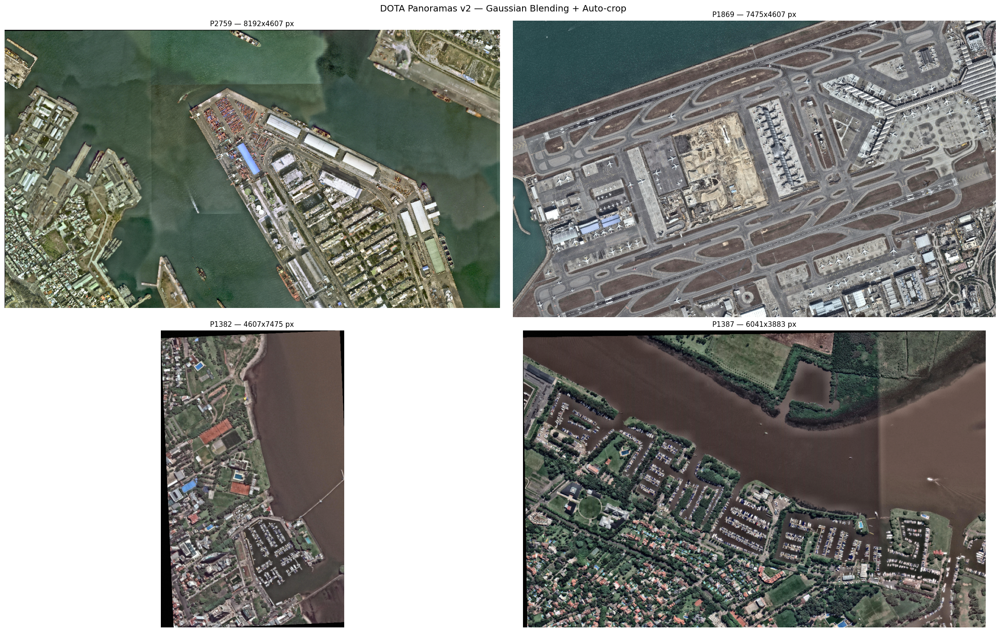


All panoramas v2 saved ✓


In [12]:
def build_panorama_v2(tiles, img_name):
    """
    Improved panorama building:
    - Gaussian weight map for smooth blending
    - Auto-crop to remove empty borders
    """
    max_x = max(t["x2"] for t in tiles)
    max_y = max(t["y2"] for t in tiles)
    print(f"\n{img_name}: canvas {max_x}x{max_y} px")

    canvas      = np.zeros((max_y, max_x, 3), dtype=np.float32)
    weight_sum  = np.zeros((max_y, max_x),    dtype=np.float32)

    # Gaussian weight map for each tile 
    def gaussian_weight(h, w):
        """Center-weighted Gaussian mask — smooth at edges."""
        gy = np.hanning(h)
        gx = np.hanning(w)
        return np.outer(gy, gx).astype(np.float32)

    for i, t in enumerate(tiles):
        x1, y1 = t["x1"], t["y1"]
        x2, y2 = t["x2"], t["y2"]
        tw, th  = x2 - x1, y2 - y1

        tile_img = cv2.resize(
            t["img_enhanced"], (tw, th)
        ).astype(np.float32)

        # Gaussian weight
        w_map = gaussian_weight(th, tw)

        canvas[y1:y2, x1:x2]     += tile_img * w_map[:, :, np.newaxis]
        weight_sum[y1:y2, x1:x2] += w_map

        if (i+1) % 10 == 0:
            print(f"  Placed {i+1}/{len(tiles)} tiles ...")

    # Normalize 
    weight_sum = np.maximum(weight_sum, 1e-8)
    panorama   = (canvas / weight_sum[:, :, np.newaxis])
    panorama   = np.clip(panorama, 0, 255).astype(np.uint8)

    # Auto-crop empty borders
    gray    = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
    mask    = gray > 5
    rows    = np.any(mask, axis=1)
    cols    = np.any(mask, axis=0)
    y_min, y_max = np.where(rows)[0][[0, -1]]
    x_min, x_max = np.where(cols)[0][[0, -1]]
    panorama = panorama[y_min:y_max+1, x_min:x_max+1]

    h, w = panorama.shape[:2]
    print(f"  Cropped to: {w}x{h} px ✓")
    return panorama

# Rebuild all panoramas 
panoramas = {}
for name in SELECTED:
    pano = build_panorama_v2(all_tiles[name], name)
    panoramas[name] = pano
    out_path = os.path.join(OUTPUT_DIR, f"{name}_panorama.jpg")
    cv2.imwrite(out_path, pano, [cv2.IMWRITE_JPEG_QUALITY, 95])
    print(f"  Saved → {out_path}")

# Visualize 
fig, axes = plt.subplots(2, 2, figsize=(22, 14))
for ax, name in zip(axes.flat, SELECTED):
    pano  = panoramas[name]
    h, w  = pano.shape[:2]
    scale = 900 / max(h, w)
    thumb = cv2.resize(
        cv2.cvtColor(pano, cv2.COLOR_BGR2RGB),
        (int(w*scale), int(h*scale))
    )
    ax.imshow(thumb)
    ax.set_title(f"{name} — {w}x{h} px", fontsize=11)
    ax.axis("off")

plt.suptitle("DOTA Panoramas v2 — Gaussian Blending + Auto-crop", fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "all_panoramas_v2.png"),
            dpi=120, bbox_inches="tight")
plt.show()
print("\nAll panoramas v2 saved ✓")

## Step 6 — Stitching Quality Evaluation
In a real deployment scenario, the original image is unavailable.
Quality is measured by:
1. Feature Matching Quality — LoFTR inliers and confidence per pair
2. Coverage Score — percentage of canvas covered by valid tiles
3. Seam Visibility — gradient analysis at tile boundaries

Evaluating stitching quality ...


P2759:
  Pair Success Rate : 99.1% (114/115)
  Avg Inliers/pair  : 771
  Avg LoFTR Conf    : 0.924
  Coverage          : 99.8%
  Avg Gradient      : 43.52  (lower = smoother)

P1869:
  Pair Success Rate : 100.0% (104/104)
  Avg Inliers/pair  : 858
  Avg LoFTR Conf    : 0.958
  Coverage          : 100.0%
  Avg Gradient      : 43.32  (lower = smoother)

P1382:
  Pair Success Rate : 100.0% (104/104)
  Avg Inliers/pair  : 866
  Avg LoFTR Conf    : 0.988
  Coverage          : 94.4%
  Avg Gradient      : 22.22  (lower = smoother)

P1387:
  Pair Success Rate : 100.0% (67/67)
  Avg Inliers/pair  : 884
  Avg LoFTR Conf    : 0.982
  Coverage          : 98.1%
  Avg Gradient      : 40.33  (lower = smoother)


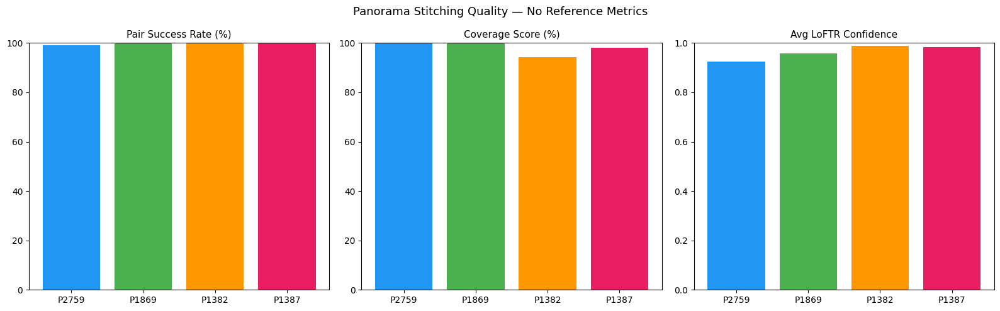


Evaluation done ✓


In [13]:
def evaluate_stitching_quality(tiles, homographies, panorama, img_name):
    """
    Evaluate panorama quality without the original image.
    """
    results = {}

    # 1. Feature Matching Quality 
    inliers_list = []
    conf_list    = []
    for key, val in homographies.items():
        if val["H"] is not None:
            inliers_list.append(val["inliers"])
    
    # Re-run LoFTR on sample pairs to get confidence
    sample_pairs = list(homographies.keys())[:5]
    tile_dict    = {(t["row"], t["col"]): t for t in tiles}
    
    for r1, c1, r2, c2 in sample_pairs:
        if (r1,c1) in tile_dict and (r2,c2) in tile_dict:
            t1 = tile_dict[(r1,c1)]
            t2 = tile_dict[(r2,c2)]
            _, _, conf = match_loftr(
                t1["img_enhanced"],
                t2["img_enhanced"]
            )
            if len(conf) > 0:
                conf_list.append(conf.mean())

    avg_inliers = np.mean(inliers_list) if inliers_list else 0
    avg_conf    = np.mean(conf_list)    if conf_list    else 0
    valid_pairs = sum(1 for v in homographies.values() if v["H"] is not None)
    total_pairs = len(homographies)

    results["avg_inliers"]    = avg_inliers
    results["avg_confidence"] = avg_conf
    results["valid_pairs"]    = valid_pairs
    results["total_pairs"]    = total_pairs
    results["pair_success"]   = valid_pairs / total_pairs * 100

    # 2. Coverage Score 
    gray        = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
    covered     = np.sum(gray > 5)
    total_px    = gray.size
    coverage    = covered / total_px * 100
    results["coverage"] = coverage

    # 3. Seam Visibility 
    # Gradient magnitude — lower = smoother seams
    grad_x    = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y    = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    grad_mag  = np.sqrt(grad_x**2 + grad_y**2)
    results["avg_gradient"] = grad_mag.mean()

    # Print 
    print(f"\n{img_name}:")
    print(f"  Pair Success Rate : {results['pair_success']:.1f}%"
          f" ({valid_pairs}/{total_pairs})")
    print(f"  Avg Inliers/pair  : {avg_inliers:.0f}")
    print(f"  Avg LoFTR Conf    : {avg_conf:.3f}")
    print(f"  Coverage          : {coverage:.1f}%")
    print(f"  Avg Gradient      : {results['avg_gradient']:.2f}"
          f"  (lower = smoother)")

    return results

# Evaluate all 
print("Evaluating stitching quality ...\n")
all_results = {}
for name in SELECTED:
    r = evaluate_stitching_quality(
        all_tiles[name],
        all_homographies[name],
        panoramas[name],
        name
    )
    all_results[name] = r

# Plot 
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
names  = list(all_results.keys())
colors = ["#2196F3", "#4CAF50", "#FF9800", "#E91E63"]

axes[0].bar(names, [all_results[n]["pair_success"]  for n in names], color=colors)
axes[0].set_title("Pair Success Rate (%)",  fontsize=11)
axes[0].set_ylim(0, 100)

axes[1].bar(names, [all_results[n]["coverage"]      for n in names], color=colors)
axes[1].set_title("Coverage Score (%)",     fontsize=11)
axes[1].set_ylim(0, 100)

axes[2].bar(names, [all_results[n]["avg_confidence"] for n in names], color=colors)
axes[2].set_title("Avg LoFTR Confidence",   fontsize=11)
axes[2].set_ylim(0, 1)

plt.suptitle("Panorama Stitching Quality — No Reference Metrics", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "stitching_quality.png"), dpi=120)
plt.show()
print("\nEvaluation done ✓")

## Step 7 — Final Pipeline Summary Visualization
A comprehensive visualization showing the complete pipeline:
input tiles sample → LoFTR matches → final panorama → quality metrics

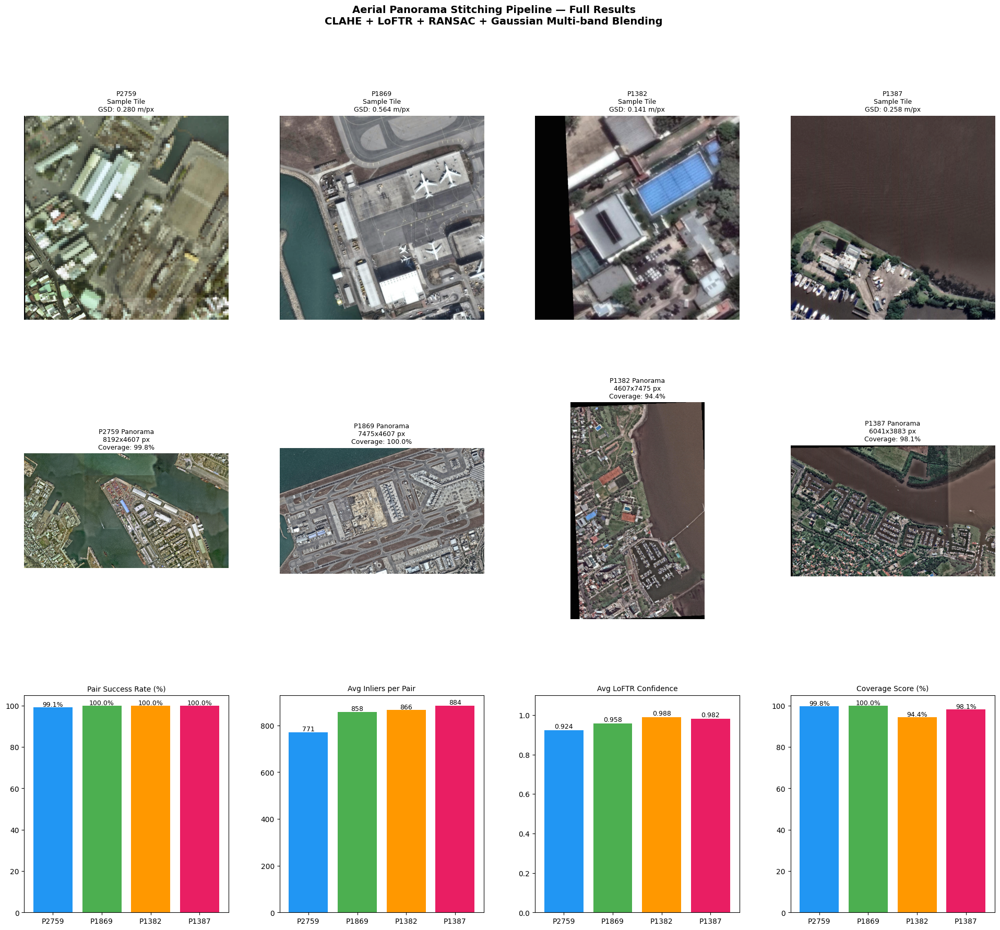

Pipeline summary saved ✓


In [14]:
fig = plt.figure(figsize=(24, 20))
gs  = fig.add_gridspec(3, 4, hspace=0.35, wspace=0.25)

# Row 1: Sample tiles for each image
for idx, name in enumerate(SELECTED):
    ax  = fig.add_subplot(gs[0, idx])
    t   = all_tiles[name][len(all_tiles[name])//2]
    img = cv2.cvtColor(t["img_enhanced"], cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(f"{name}\nSample Tile\n"
                 f"GSD: {t['gsd']:.3f} m/px", fontsize=9)
    ax.axis("off")

# Row 2: Final panoramas
for idx, name in enumerate(SELECTED):
    ax    = fig.add_subplot(gs[1, idx])
    pano  = panoramas[name]
    h, w  = pano.shape[:2]
    scale = 500 / max(h, w)
    thumb = cv2.resize(
        cv2.cvtColor(pano, cv2.COLOR_BGR2RGB),
        (int(w*scale), int(h*scale))
    )
    ax.imshow(thumb)
    r     = all_results[name]
    ax.set_title(
        f"{name} Panorama\n"
        f"{w}x{h} px\n"
        f"Coverage: {r['coverage']:.1f}%",
        fontsize=9
    )
    ax.axis("off")

# Row 3: Quality metrics bars
names  = list(all_results.keys())
colors = ["#2196F3", "#4CAF50", "#FF9800", "#E91E63"]

# Pair Success Rate
ax1 = fig.add_subplot(gs[2, 0])
vals = [all_results[n]["pair_success"] for n in names]
bars = ax1.bar(names, vals, color=colors)
ax1.set_title("Pair Success Rate (%)", fontsize=10)
ax1.set_ylim(0, 105)
for bar, v in zip(bars, vals):
    ax1.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.5,
             f"{v:.1f}%", ha="center", fontsize=9)

# Avg Inliers
ax2 = fig.add_subplot(gs[2, 1])
vals = [all_results[n]["avg_inliers"] for n in names]
bars = ax2.bar(names, vals, color=colors)
ax2.set_title("Avg Inliers per Pair", fontsize=10)
for bar, v in zip(bars, vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 5,
             f"{v:.0f}", ha="center", fontsize=9)

# LoFTR Confidence
ax3 = fig.add_subplot(gs[2, 2])
vals = [all_results[n]["avg_confidence"] for n in names]
bars = ax3.bar(names, vals, color=colors)
ax3.set_title("Avg LoFTR Confidence", fontsize=10)
ax3.set_ylim(0, 1.1)
for bar, v in zip(bars, vals):
    ax3.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.01,
             f"{v:.3f}", ha="center", fontsize=9)

# Coverage
ax4 = fig.add_subplot(gs[2, 3])
vals = [all_results[n]["coverage"] for n in names]
bars = ax4.bar(names, vals, color=colors)
ax4.set_title("Coverage Score (%)", fontsize=10)
ax4.set_ylim(0, 105)
for bar, v in zip(bars, vals):
    ax4.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.5,
             f"{v:.1f}%", ha="center", fontsize=9)

fig.suptitle(
    "Aerial Panorama Stitching Pipeline — Full Results\n"
    "CLAHE + LoFTR + RANSAC + Gaussian Multi-band Blending",
    fontsize=14, fontweight="bold"
)

plt.savefig(os.path.join(OUTPUT_DIR, "pipeline_summary.png"),
            dpi=130, bbox_inches="tight")
plt.show()
print("Pipeline summary saved ✓")

## Step 8 — Save Pipeline Config
Save all pipeline parameters and quality results for FastAPI deployment.

In [16]:
import pickle
import json
import numpy as np

# Fix JSON serialization 
def convert_to_serializable(obj):
    if isinstance(obj, np.float32):
        return float(obj)
    if isinstance(obj, np.int32):
        return int(obj)
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    if isinstance(obj, dict):
        return {k: convert_to_serializable(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [convert_to_serializable(i) for i in obj]
    return obj

# Save pipeline config 
pipeline_config = {
    "tile_size"    : 1024,
    "overlap"      : 0.30,
    "stride"       : 717,
    "clahe_clip"   : 1.5,
    "loftr_conf"   : 0.5,
    "ransac_thresh": 3.0,
    "blend_levels" : 3,
    "quality"      : convert_to_serializable(all_results)
}

with open("/kaggle/working/pipeline_config.pkl", "wb") as f:
    pickle.dump(pipeline_config, f)

with open("/kaggle/working/quality_results.json", "w") as f:
    json.dump(convert_to_serializable(all_results), f, indent=2)

print("Saved:")
print("  ✓ pipeline_config.pkl")
print("  ✓ quality_results.json")
print("\nPipeline complete!")
print("="*40)
print("Next step: FastAPI deployment")

Saved:
  ✓ pipeline_config.pkl
  ✓ quality_results.json

Pipeline complete!
Next step: FastAPI deployment
